In [4]:
import os
os.chdir("/content/drive/MyDrive/Pengolahan Citra")
#%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import the necessary packages specific to Computer vision
import cv2

In [5]:
seed_value = 123; np.random.seed(seed_value);

In [6]:
exec(open(os.path.abspath('image_common_utils.py')).read())

In [7]:
# Write one function for face detection so that we can use it for face in videos too
def detect_and_show_face_in_image(image_for_face_detection, face_cascade_classifier, eye_cascade_classifier, sz):
    # Convert to gray
    gray = cv2.cvtColor(image_for_face_detection, cv2.COLOR_BGR2GRAY)

    # detect face
    faces = face_cascade_classifier.detectMultiScale(gray, scaleFactor = 1.3, # jump in the scaling factor, as in, if we don't find an image in the current scale, the next size to check will be, in our case, 1.3 times bigger than the current size.
                                                     minNeighbors = 5, minSize=(30, 30))
    str_msg_on_image = 'faces: ' + str(len(faces)); eyes_count = 0
    for (x,y,w,h) in faces:
        #Sanity test
        if h <= 0 or w <= 0: pass

        # get face rectangle
        image_for_face_detection = cv2.rectangle(image_for_face_detection,(x,y),(x+w,y+h),(255,0,0),2)
        roi_gray = gray[y:y+h, x:x+w]

        # detect eye
        eyes = eye_cascade_classifier.detectMultiScale(roi_gray)


        roi_color = image_for_face_detection[y:y+h, x:x+w]
        # get eye rectangle
        for (ex,ey,ew,eh) in eyes:
            cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
            eyes_count = eyes_count + 1
    # end of for (x,y,w,h) in faces:

    #Update text and put the text on image
    str_msg_on_image = str_msg_on_image + ', eyes: ' + str(eyes_count)
    cv2.putText(image_for_face_detection, str_msg_on_image, (sz[0]-200, sz[1]-25), cv2.FONT_HERSHEY_PLAIN, 1, (0,0,0), 1, cv2.LINE_AA)

    return(image_for_face_detection)
# end of detect_and_show_face_in_image

In [9]:
# get classifiers
face_cascade_classifier = cv2.CascadeClassifier('./haarscascades/haarcascade_frontalface_default.xml')
if face_cascade_classifier.empty():
    print('Missing face classifier xml file')

In [8]:
eye_cascade_classifier = cv2.CascadeClassifier('./haarscascades/haarcascade_eye_tree_eyeglasses.xml')
if eye_cascade_classifier.empty():
    print('Missing eye classifier xml file')

In [10]:
image = cv2.imread('./taylor.jpg')

In [11]:
# get images
image_for_face_detection = image
sz = (image_for_face_detection.shape[1], image_for_face_detection.shape[0])

In [12]:
#do face detection
image_for_face_detection = detect_and_show_face_in_image(image_for_face_detection, face_cascade_classifier, eye_cascade_classifier, sz)

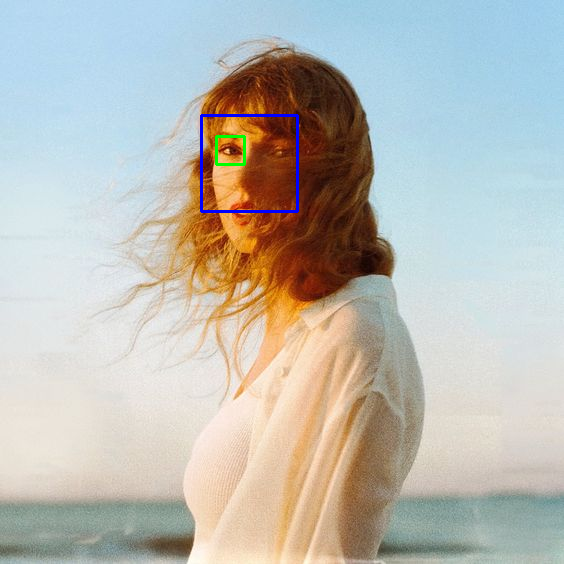

In [12]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the cascade classifiers for face and eye detection
face_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# Read the image
image_for_face_detection = image
gray = cv2.cvtColor(image_for_face_detection, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade_classifier.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5, minSize=(30, 30))

for (x, y, w, h) in faces:
    # Draw rectangle around the face
    cv2.rectangle(image_for_face_detection, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Region of interest for the face
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = image_for_face_detection[y:y+h, x:x+w]

    # Detect eyes within the face region
    eyes = eye_cascade_classifier.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# Display the result
cv2_imshow(image_for_face_detection)

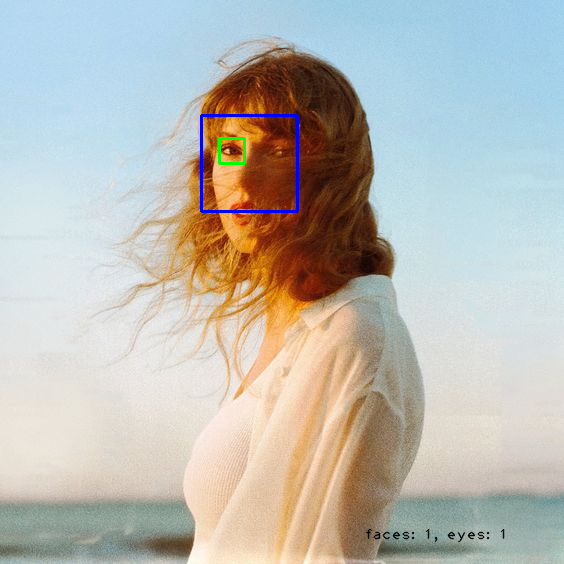

Number of faces detected: 0
Number of eyes detected: 0


In [13]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the cascade classifiers for face and eye detection
face_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

# Read the image
image_for_face_detection = image
gray = cv2.cvtColor(image_for_face_detection, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade_classifier.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5, minSize=(30, 30))

# Initialize face and eye counters
num_faces = 0
num_eyes = 0

for (x, y, w, h) in faces:
    # Increment face counter
    num_faces += 1

    # Draw rectangle around the face
    cv2.rectangle(image_for_face_detection, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Region of interest for the face
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = image_for_face_detection[y:y+h, x:x+w]

    # Detect eyes within the face region
    eyes = eye_cascade_classifier.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        # Increment eye counter
        num_eyes += 1
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# Display the result
cv2_imshow(image_for_face_detection)

# Print the counts of faces and eyes
print(f"Number of faces detected: {num_faces}")
print(f"Number of eyes detected: {num_eyes}")




---



In [14]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the cascade classifiers for face and eye detection
face_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

def detect_and_show_face_in_image(frame, face_cascade, eye_cascade, size):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5, minSize=(30, 30))
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = frame[y:y + h, x:x + w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
    return frame

# Capture from device index or the name of a video file
capture_video = cv2.VideoCapture(0)
if not capture_video.isOpened():
    print("Error: Could not open video capture.")
else:
    sz = (int(capture_video.get(cv2.CAP_PROP_FRAME_WIDTH)), int(capture_video.get(cv2.CAP_PROP_FRAME_HEIGHT)))

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'DIVX')
    out = cv2.VideoWriter('./image_output/faces_video.avi', fourcc, 20, (640, 480))

    while capture_video.isOpened():
        ret, frame = capture_video.read()
        if ret:
            # Perform face and eye detection
            frame = detect_and_show_face_in_image(frame, face_cascade_classifier, eye_cascade_classifier, sz)
            # Write the frame
            out.write(frame)
            # Display the frame
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        else:
            break

    # Release everything if job is finished
    capture_video.release()
    out.release()
    cv2.destroyAllWindows()

Error: Could not open video capture.


Saving 00079.MTS to 00079.MTS


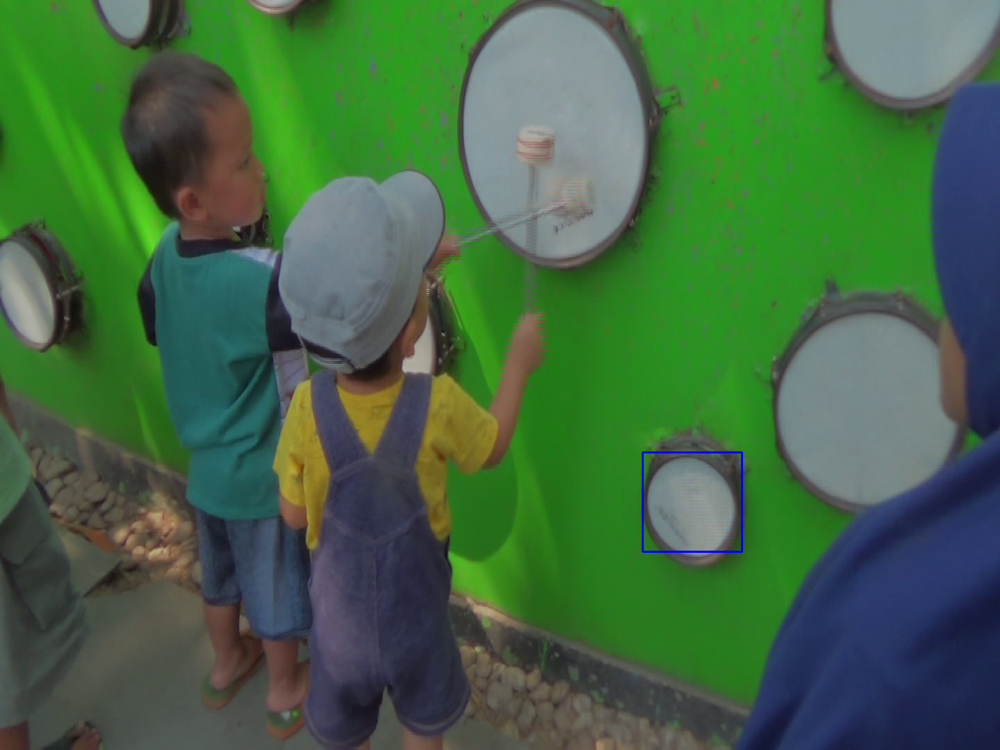

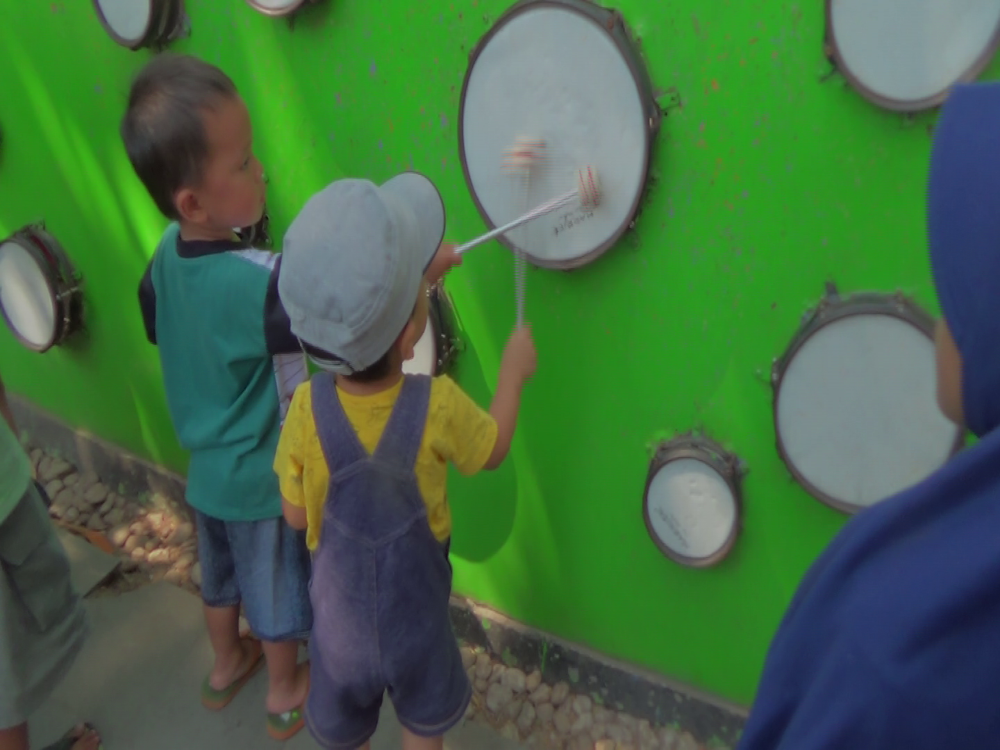

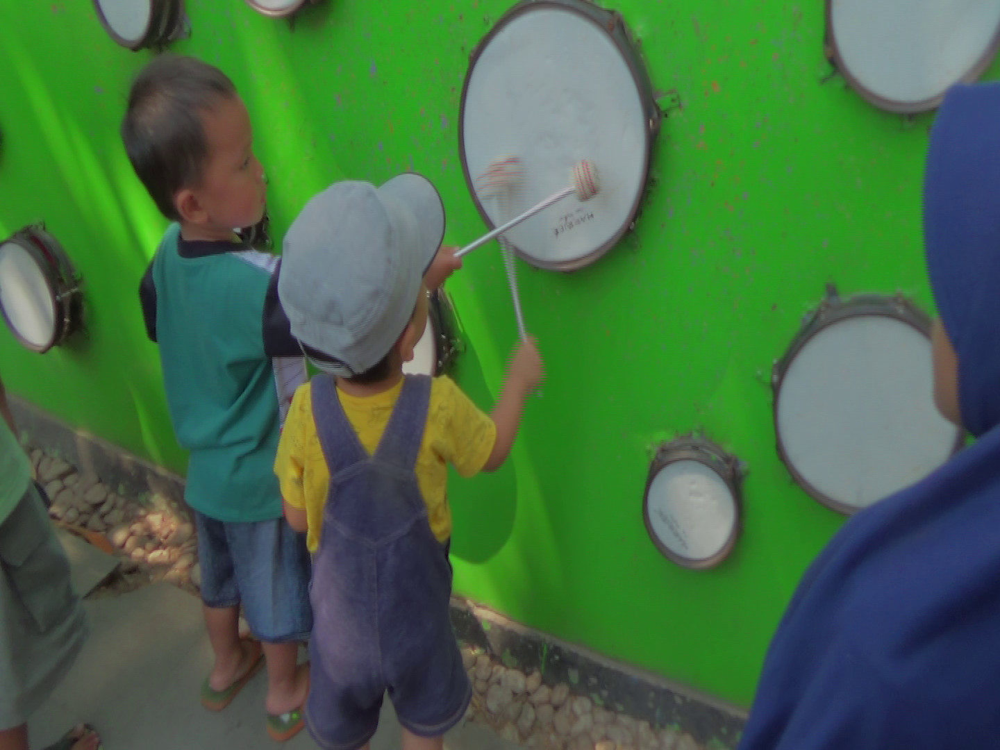

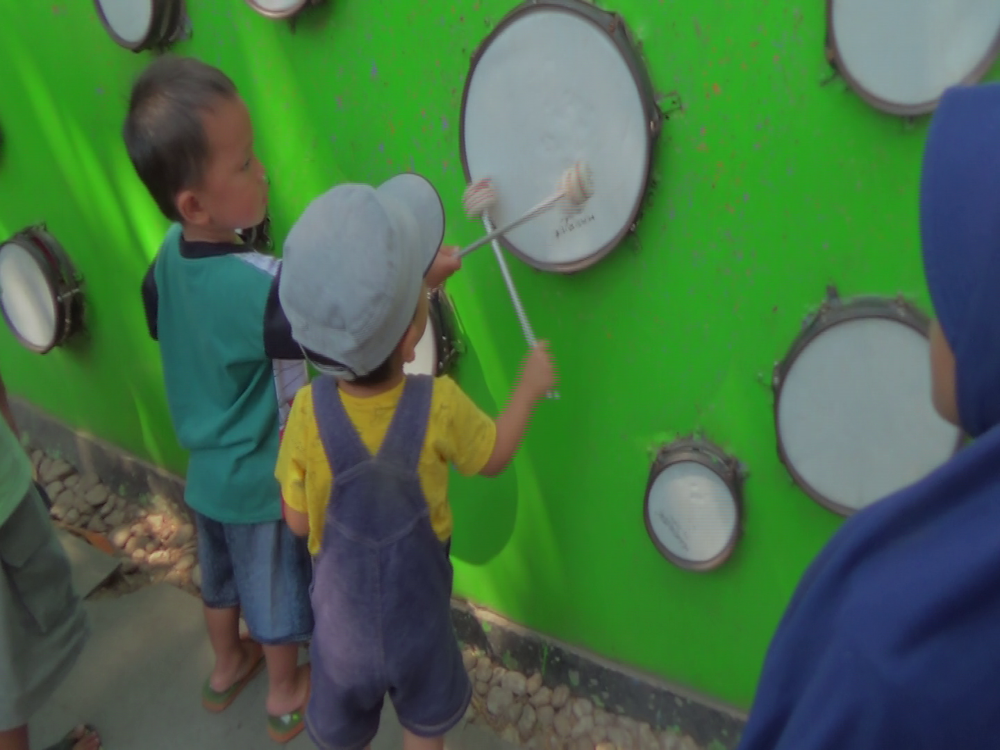

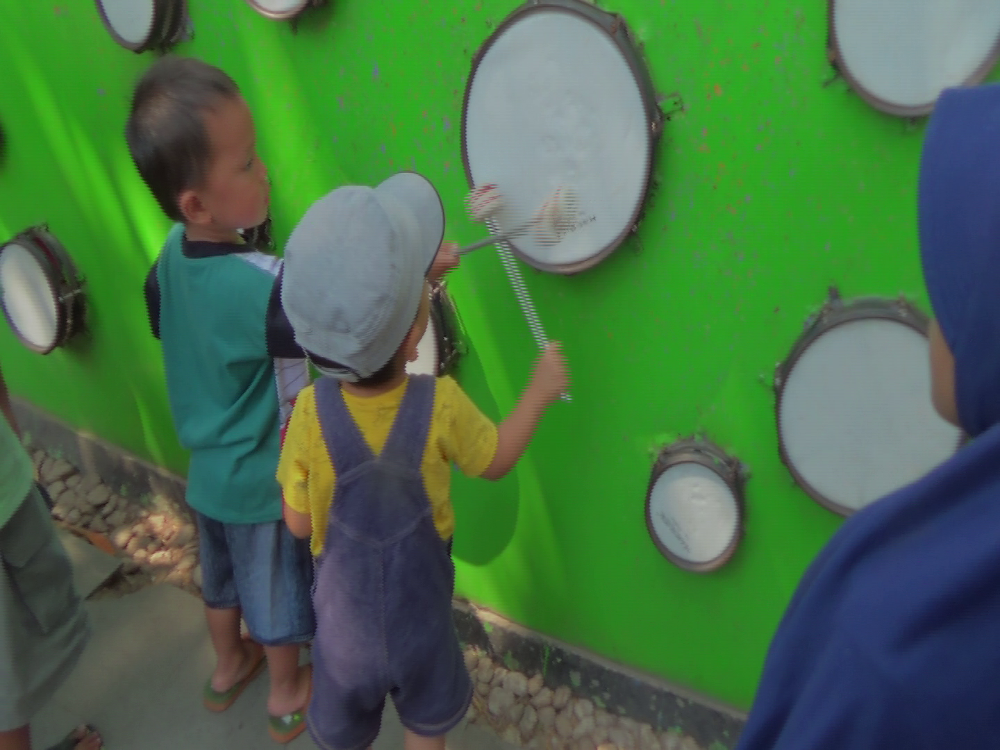

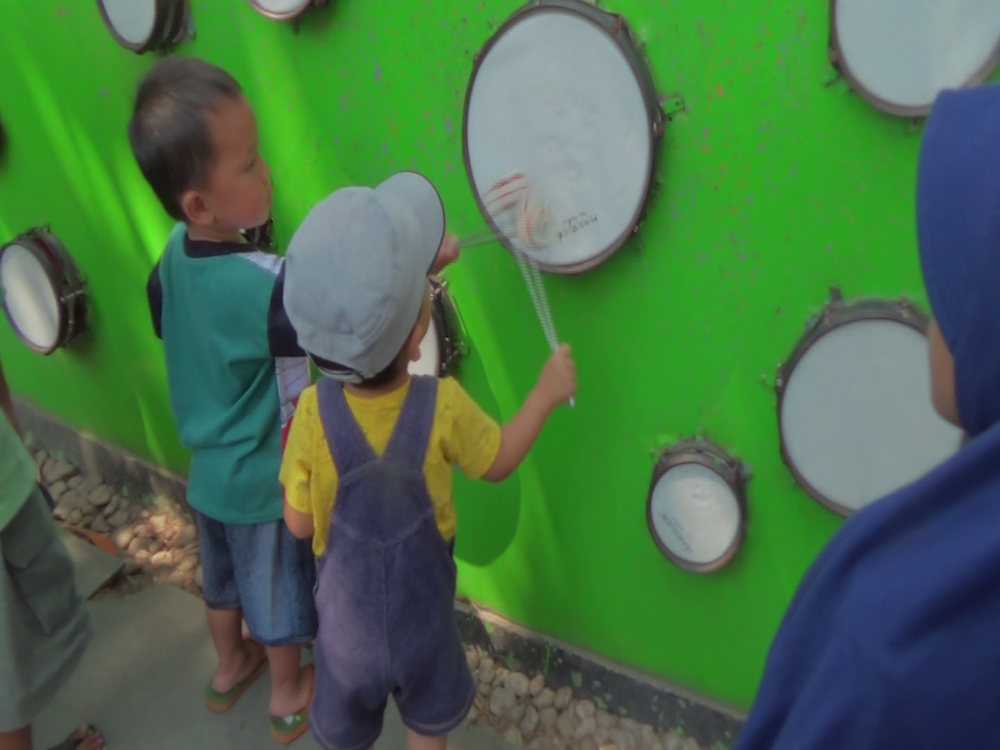

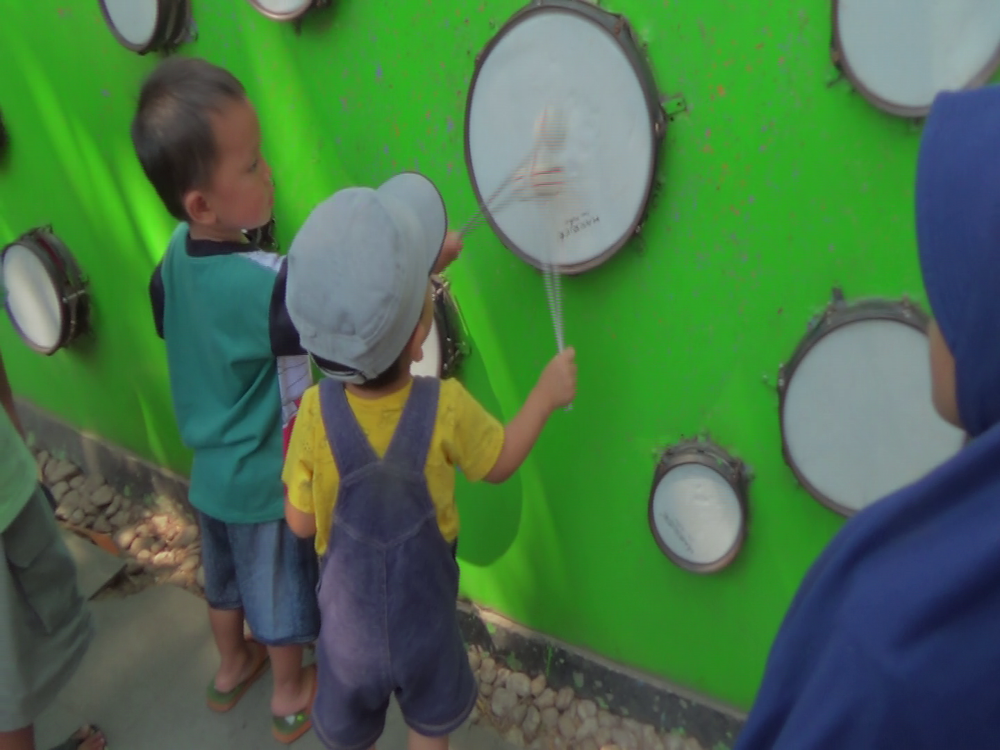

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files

# Upload the video file
uploaded = files.upload()

# Load the cascade classifiers for face and eye detection
face_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade_classifier = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

def detect_and_show_face_in_image(frame, face_cascade, eye_cascade):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5, minSize=(30, 30))
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)
        roi_gray = gray[y:y + h, x:x + w]
        roi_color = frame[y:y + h, x:x + w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)
    return frame

# Use the uploaded video file
video_path = list(uploaded.keys())[0]
capture_video = cv2.VideoCapture(video_path)

if not capture_video.isOpened():
    print("Error: Could not open video file.")
else:
    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'DIVX')
    out = cv2.VideoWriter('faces_video.avi', fourcc, 20.0, (640, 480))

    while capture_video.isOpened():
        ret, frame = capture_video.read()
        if ret:
            # Perform face and eye detection
            frame = detect_and_show_face_in_image(frame, face_cascade_classifier, eye_cascade_classifier)
            # Write the frame
            out.write(frame)
            # Display the frame
            cv2_imshow(frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        else:
            break

    # Release everything if job is finished
    capture_video.release()
    out.release()
    cv2.destroyAllWindows()


In [ ]:
# Capture from device index or the name of a video file
capture_video = cv2.VideoCapture(0)
sz = (int(capture_video.get(cv2.CAP_PROP_FRAME_WIDTH)), int(capture_video.get(cv2.CAP_PROP_FRAME_HEIGHT)))

# Define the codec and create VideoWriter object. http://www.fourcc.org/codecs.php
fourcc = cv2.VideoWriter_fourcc(*'DIVX')
out = cv2.VideoWriter('./image_output/faces_video.avi',fourcc, 20, (640,480))

# for full screen
window_name = 'frame'
cv2.namedWindow(window_name, cv2.WND_PROP_FULLSCREEN)
cv2.setWindowProperty(window_name, cv2.WND_PROP_FULLSCREEN, cv2.WINDOW_FULLSCREEN)

while(capture_video.isOpened()):
    ret, frame = capture_video.read()
    #frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if ret==True:
        #do face detection
        frame = detect_and_show_face_in_image(frame, face_cascade_classifier, eye_cascade_classifier, sz)
        # write the frame
        out.write(frame)

        cv2.imshow(window_name,frame)
        k = cv2.waitKey(1) & 0xFF
        if k == ord('q') or k == 27:
            break
    else:
        break

# Release everything if job is finished
capture_video.release(); out.release(); cv2.destroyAllWindows()